<a href="https://colab.research.google.com/github/kenzuroid-tech/PVCK_Ganjil_2026/blob/main/Week3.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


 Mengubah tingkat kecerahan citra 
----------------------------------
Masukkan nilai kecerahan: 30


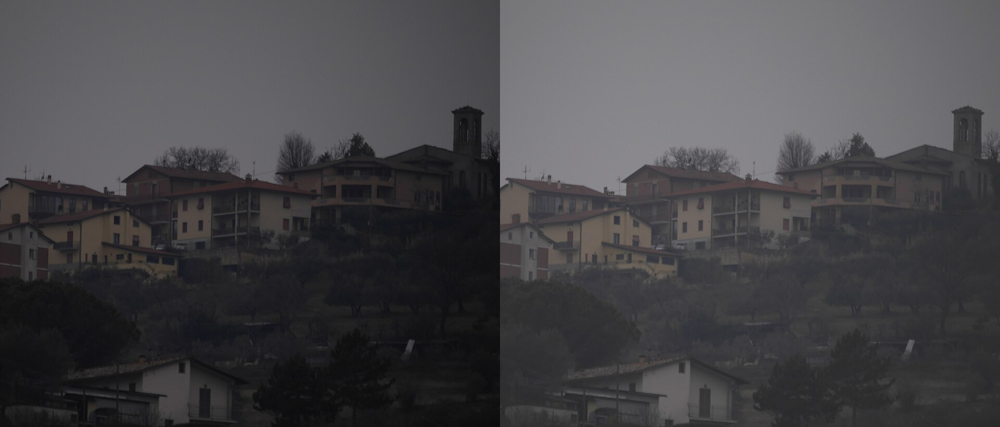

In [6]:
import cv2 as cv
from google.colab.patches import cv2_imshow
from skimage import io
import matplotlib.pyplot as plt
import numpy as np

print(' Mengubah tingkat kecerahan citra ')
print('----------------------------------')
try:
  brightness = int(input('Masukkan nilai kecerahan: '))
except ValueError:
  print('Error, not a number')

original = cv.imread('/content/drive/MyDrive/PVCK/GAMBAR/House.jpg')
brightness_image = np.zeros(original.shape, original.dtype)

#akses per pixel
for y in range(original.shape[0]):
    for x in range(original.shape[1]):
        for c in range(original.shape[2]):
            brightness_image[y, x, c] = np.clip(int(original[y, x, c]) + brightness, 0, 255)

#cara simple tanpa for loop
#brightness_image = cv.convertScaleAbs(original, beta=brightness)

final_frame = cv.hconcat((original, brightness_image))
cv2_imshow(final_frame)

**Tugas Praktikum**



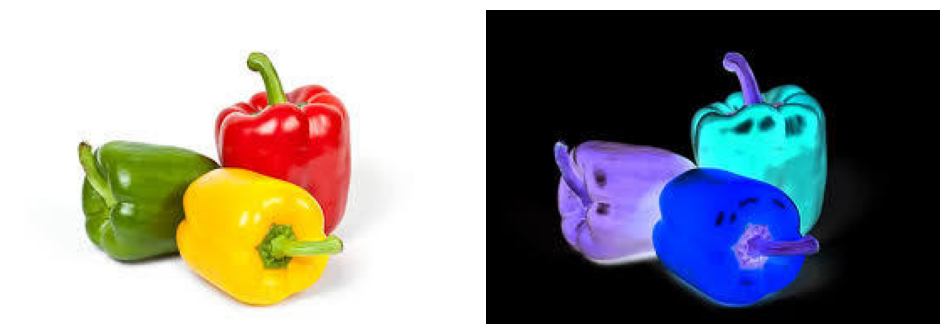

In [8]:
# 1. Implementasi inverse citra

import cv2 as cv
import matplotlib.pyplot as plt

# 1. Membaca gambar dari Google Drive
original = cv.imread('/content/drive/MyDrive/PVCK/GAMBAR/Sayur.jpg')

# 2. Konversi warna dari BGR (bawaan OpenCV) ke RGB (standar Matplotlib)
original_rgb = cv.cvtColor(original, cv.COLOR_BGR2RGB)

# 3. Proses inverse warna pada gambar RGB
inverse_rgb = cv.bitwise_not(original_rgb)

# 4. Mengatur ukuran kanvas (figure) tampilan
plt.figure(figsize=(12, 6))

# 5. Menampilkan Gambar Asli di posisi kiri (kolom 1)
plt.subplot(1, 2, 1)
plt.imshow(original_rgb)
plt.axis('off')

# 6. Menampilkan Gambar Inverse di posisi kanan (kolom 2)
plt.subplot(1, 2, 2)
plt.imshow(inverse_rgb)
plt.axis('off')

# 7. Merapikan jarak antar gambar dan menampilkannya
plt.subplots_adjust(wspace=0.05)
plt.show()

 Mengubah kontras dan tingkat kecerahan citra 
----------------------------------------------
Masukkan tingkat kecerahan: 10
Masukkan kontras: 1.5


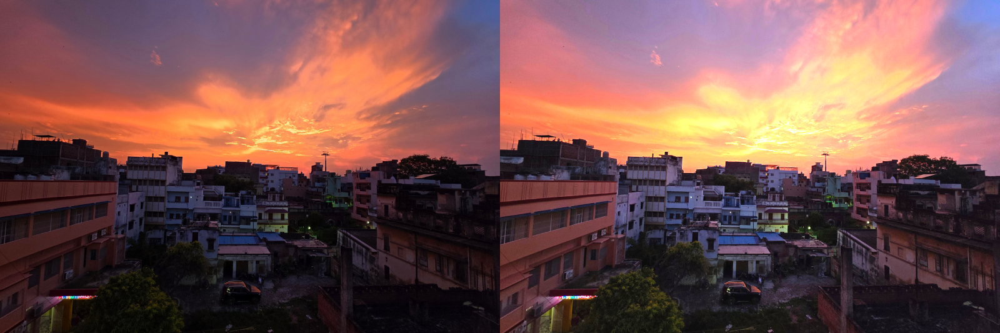

In [14]:
# 2. Implementasi transformasi contrast

import cv2 as cv
import numpy as np
from google.colab.patches import cv2_imshow

print(' Mengubah kontras dan tingkat kecerahan citra ')
print('----------------------------------------------')
try:
    brightness = int(input('Masukkan tingkat kecerahan: '))
except ValueError:
    print('Error, not a number')
    brightness = 0

try:
    contrast = float(input('Masukkan kontras: '))
except ValueError:
    print('Error, not a number')
    contrast = 1.0

original = cv.imread('/content/drive/MyDrive/PVCK/GAMBAR/Sunset.jpg')
# Hanya perlu membuat satu variabel array kosong untuk hasil gabungan
hasil_image = np.zeros(original.shape, original.dtype)

# Proses penggabungan brightness dan contrast dalam satu perulangan
for y in range(original.shape[0]):
    for x in range(original.shape[1]):
        for c in range(original.shape[2]):
            # Kalikan nilai piksel dengan contrast, lalu tambahkan dengan brightness
            nilai_baru = (float(original[y, x, c]) * contrast) + brightness
            hasil_image[y, x, c] = np.clip(nilai_baru, 0, 255)

# Menggabungkan gambar asli dan gambar hasil (gabungan brightness+contrast)
final_frame = cv.hconcat((original, hasil_image))
cv2_imshow(final_frame)

 Mengubah kecerahan dengan Logaritma (Logarithmic Brightness) 
--------------------------------------------------------------
Masukkan nilai konstanta C : 50


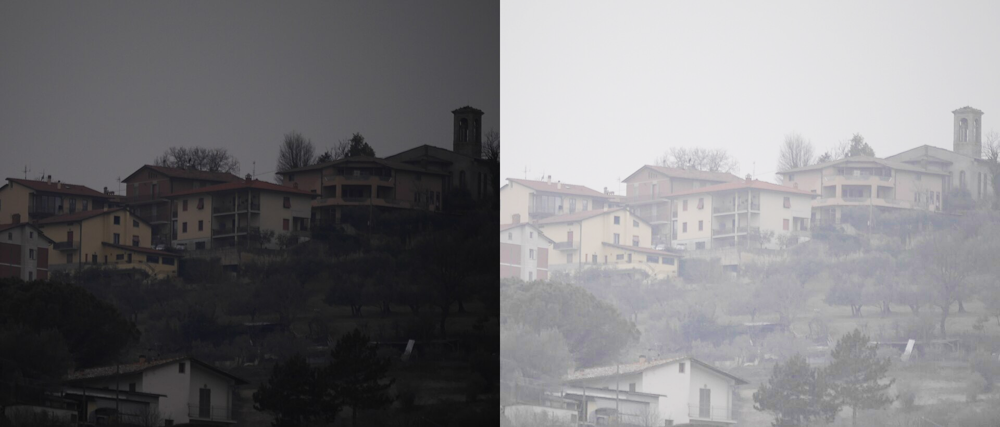

In [17]:
# 3. Implementasi transformasi logarithmic brightness

import cv2 as cv
import numpy as np
import math
from google.colab.patches import cv2_imshow

print(' Mengubah kecerahan dengan Logaritma (Logarithmic Brightness) ')
print('--------------------------------------------------------------')

try:
    c_konstanta = float(input('Masukkan nilai kecerahan : '))
except ValueError:
    print('Error, not a number.')
    c_konstanta = 45.0

original = cv.imread('/content/drive/MyDrive/PVCK/GAMBAR/House.jpg')

if original is not None:
    brightness_image = np.zeros(original.shape, original.dtype)

    for y in range(original.shape[0]):
        for x in range(original.shape[1]):
            for channel in range(original.shape[2]):

                r = int(original[y, x, channel])

                # 3. Menerapkan rumus logaritma: s = c * log(1 + r)
                s = c_konstanta * math.log(1 + r)

                brightness_image[y, x, channel] = np.clip(s, 0, 255)

    final_frame = cv.hconcat((original, brightness_image))
    cv2_imshow(final_frame)
else:
    print("Gambar tidak ditemukan.")

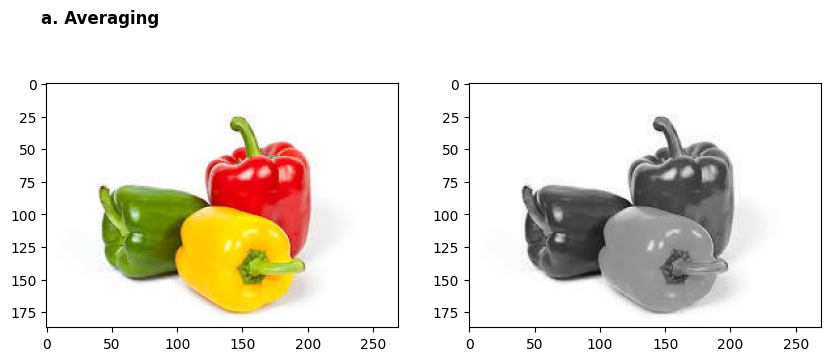

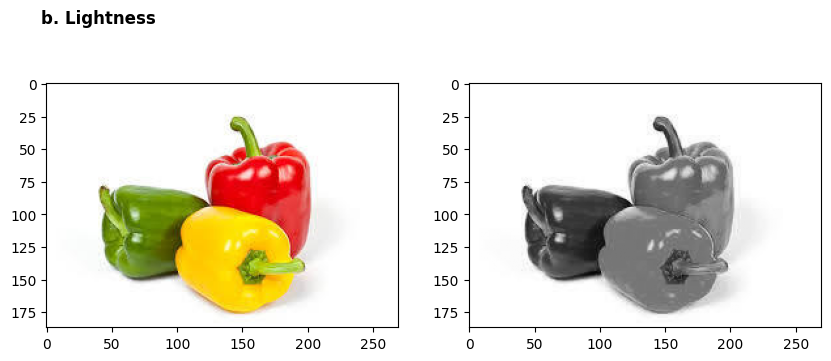

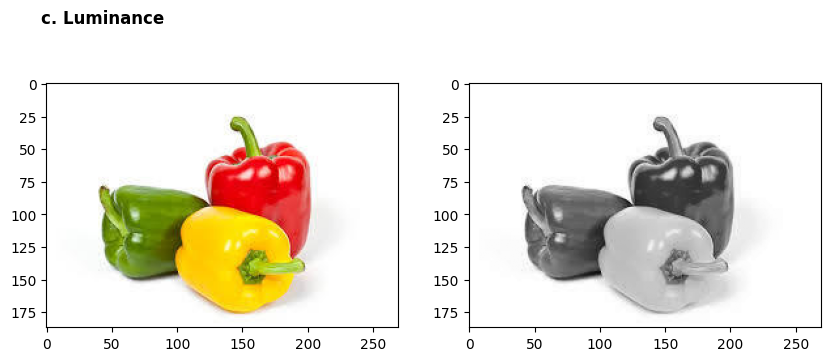

In [19]:
# 4. Implementasi transformasi grayscale menggunakan metode averaging, lightness, dan luminance

import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt

# 1. Membaca gambar dan konversi ke RGB
img_bgr = cv.imread('/content/drive/MyDrive/PVCK/GAMBAR/Sayur.jpg') # Sesuaikan path file Anda
img_rgb = cv.cvtColor(img_bgr, cv.COLOR_BGR2RGB)

# 2. Memisahkan channel Red, Green, Blue dan mengubahnya ke tipe data float
R = img_rgb[:, :, 0].astype(float)
G = img_rgb[:, :, 1].astype(float)
B = img_rgb[:, :, 2].astype(float)

# a. Metode Averaging
gray_avg = (R + G + B) / 3
gray_avg = np.clip(gray_avg, 0, 255).astype(np.uint8)

# b. Metode Lightness
# Mencari nilai intensitas tertinggi dan terendah per piksel dari ketiga channel
max_rgb = np.max(img_rgb, axis=2).astype(float)
min_rgb = np.min(img_rgb, axis=2).astype(float)

gray_lightness = (max_rgb + min_rgb) / 2
gray_lightness = np.clip(gray_lightness, 0, 255).astype(np.uint8)

# c. Metode Luminance
gray_luminance = (0.299 * R) + (0.587 * G) + (0.114 * B)
gray_luminance = np.clip(gray_luminance, 0, 255).astype(np.uint8)

# 3. Fungsi untuk menampilkan gambar berdampingan dengan sumbu koordinat
def tampilkan_perbandingan(judul, img_asli, img_gray):
    fig, axes = plt.subplots(1, 2, figsize=(10, 4))
    fig.text(0.12, 0.95, judul, fontsize=12, fontweight='bold') # Menambahkan teks judul

    # Menampilkan Gambar Asli
    axes[0].imshow(img_asli)

    # Menampilkan Gambar Grayscale
    axes[1].imshow(img_gray, cmap='gray')

    plt.show()

# 4. Memanggil fungsi untuk masing-masing hasil
tampilkan_perbandingan("a. Averaging", img_rgb, gray_avg)
tampilkan_perbandingan("b. Lightness", img_rgb, gray_lightness)
tampilkan_perbandingan("c. Luminance", img_rgb, gray_luminance)

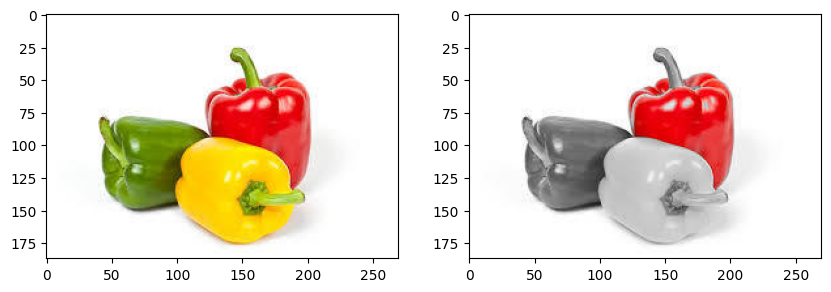

In [20]:
# 5.Menampilkan warna tertentu pada citra

import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt

img_bgr = cv.imread('/content/drive/MyDrive/PVCK/GAMBAR/Sayur.jpg') # Sesuaikan path file
img_rgb = cv.cvtColor(img_bgr, cv.COLOR_BGR2RGB)

img_hsv = cv.cvtColor(img_bgr, cv.COLOR_BGR2HSV)

# Warna merah pada OpenCV terbagi di dua sisi Hue (0-10 dan 170-180)
lower_red1 = np.array([0, 100, 100])
upper_red1 = np.array([10, 255, 255])
mask1 = cv.inRange(img_hsv, lower_red1, upper_red1)

lower_red2 = np.array([170, 100, 100])
upper_red2 = np.array([180, 255, 255])
mask2 = cv.inRange(img_hsv, lower_red2, upper_red2)

# Menggabungkan kedua mask merah
mask_merah = cv.bitwise_or(mask1, mask2)

gray_bgr = cv.cvtColor(img_bgr, cv.COLOR_BGR2GRAY)
# Konversi kembali ke 3-channel (RGB) agar bentuk matriksnya sama untuk digabungkan
gray_rgb = cv.cvtColor(gray_bgr, cv.COLOR_GRAY2RGB)

# Expand dimensi mask agar menjadi (tinggi, lebar, 3)
mask_3d = mask_merah[:, :, np.newaxis]
hasil_akhir = np.where(mask_3d == 255, img_rgb, gray_rgb)

fig, axes = plt.subplots(1, 2, figsize=(10, 4))

axes[0].imshow(img_rgb)
axes[1].imshow(hasil_akhir)

plt.show()

 Gamma Correction pada citra 
-----------------------------------------
Masukkan nilai Gamma: 0.5


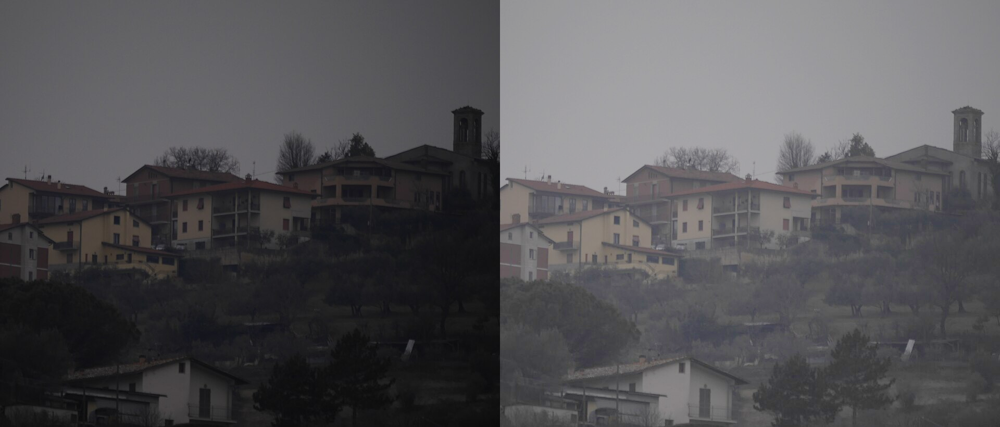

In [21]:
# 5. Membuat gamma correction

import cv2 as cv
import numpy as np
from google.colab.patches import cv2_imshow

print(' Gamma Correction pada citra ')
print('-----------------------------------------')
try:
    # Tipe data diubah menjadi float agar bisa menerima angka desimal (misal: 0.5 atau 2.2)
    gamma = float(input('Masukkan nilai Gamma: '))
except ValueError:
    print('Error, not a number')
    gamma = 1.0

original = cv.imread('/content/drive/MyDrive/PVCK/GAMBAR/House.jpg')

if original is not None:
    # 1. Normalisasi matriks piksel ke rentang 0.0 hingga 1.0
    original_norm = original / 255.0

    # 2. Menerapkan formula matematika Gamma Correction
    gamma_correction = np.power(original_norm, gamma)

    # 3. Denormalisasi kembali ke rentang 0-255 dan konversi ke format gambar (uint8)
    gamma_image = np.uint8(gamma_correction * 255)

    # 4. Menampilkan perbandingan gambar asli dan hasil koreksi
    final_frame = cv.hconcat((original, gamma_image))
    cv2_imshow(final_frame)
else:
    print("Gambar tidak ditemukan.")

Masukkan bit depth tujuan (1-8): 3
Bit depth awal  : 8 bit
Bit depth tujuan: 3 bit
Jumlah level    : 8


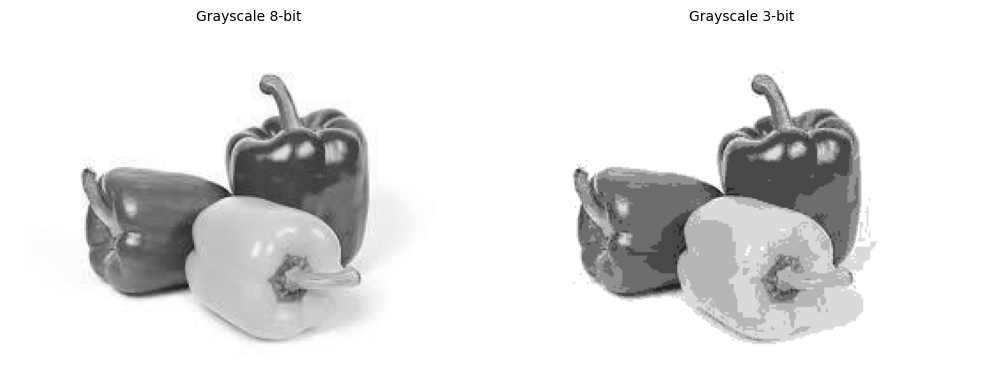

In [22]:
# 6.Membuat simulasi image depth

import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt

try:
    bit_depth = int(input('Masukkan bit depth tujuan (1-8): '))
    if bit_depth < 1 or bit_depth > 8:
        print("Rentang harus 1-8. Menggunakan nilai default: 3")
        bit_depth = 3
except ValueError:
    print("Input tidak valid. Menggunakan nilai default: 3")
    bit_depth = 3

jumlah_level = pow(2, bit_depth)
print(f'Bit depth awal  : 8 bit')
print(f'Bit depth tujuan: {bit_depth} bit')
print(f'Jumlah level    : {jumlah_level}')

level = 255.0 / (pow(2, bit_depth) - 1)
original = cv.imread('/content/drive/MyDrive/PVCK/GAMBAR/Sayur.jpg', cv.IMREAD_GRAYSCALE)

if original is not None:
    # Membagi piksel asli dengan interval level, membulatkannya, lalu mengalikannya kembali
    depth_image = np.round(original / level) * level

    # Memastikan format matriks kembali menjadi uint8 (standar gambar 8-bit)
    depth_image = depth_image.astype(np.uint8)

    fig, axes = plt.subplots(1, 2, figsize=(10, 5))

    # Gambar Asli
    axes[0].imshow(original, cmap='gray', vmin=0, vmax=255)
    axes[0].set_title('Grayscale 8-bit', fontsize=10)
    axes[0].axis('off')

    # Gambar Hasil Kuantisasi
    axes[1].imshow(depth_image, cmap='gray', vmin=0, vmax=255)
    axes[1].set_title(f'Grayscale {bit_depth}-bit', fontsize=10)
    axes[1].axis('off')

    # Merapikan jarak dan menampilkan plot
    plt.tight_layout()
    plt.show()
else:
    print("Gambar tidak ditemukan.")

Total citra noise yang berhasil dimuat: 100

--- Hasil Perhitungan PSNR ---
Jumlah Citra: 10  | Nilai PSNR: 19.7343 dB
Jumlah Citra: 20  | Nilai PSNR: 19.8420 dB
Jumlah Citra: 40  | Nilai PSNR: 19.8929 dB
Jumlah Citra: 80  | Nilai PSNR: 19.9162 dB
Jumlah Citra: 100 | Nilai PSNR: 19.9220 dB


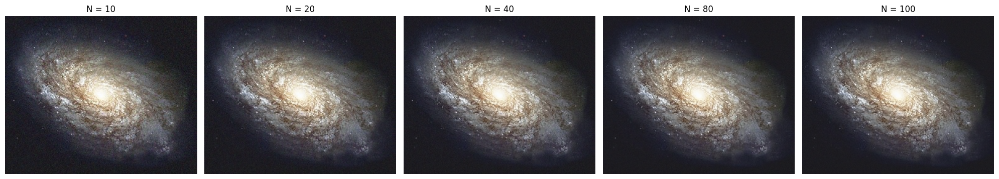

In [59]:
# 7. Membuat modul average denoising

import cv2 as cv
import numpy as np
import glob
import matplotlib.pyplot as plt

path_asli = '/content/drive/MyDrive/PVCK/GAMBAR/galaxy.jpg'
img_asli = cv.imread(path_asli)

cv_img = []
path_noises = '/content/drive/MyDrive/PVCK/GAMBAR/noises/*.jpg'

for img in glob.glob(path_noises):
    n = cv.imread(img)
    if n is not None:
        cv_img.append(n)

print(f"Total citra noise yang berhasil dimuat: {len(cv_img)}")

if img_asli is not None and len(cv_img) > 0:

    jumlah_uji = [10, 20, 40, 80, 100]
    hasil_avg = []

    print('\n--- Hasil Perhitungan PSNR ---')

    for N in jumlah_uji:
        subset_img = cv_img[:N]

        # Inisialisasi matriks kosong dengan tipe data float32
        # Float32 digunakan agar nilai piksel tidak overflow (melebihi 255) saat dijumlahkan
        img_akumulasi = np.zeros(img_asli.shape, dtype=np.float32)

        # Menjumlahkan seluruh matriks citra noise
        for img_noise in subset_img:
            img_akumulasi += img_noise.astype(np.float32)

        # Membagi dengan N untuk mendapatkan rata-rata
        img_avg = img_akumulasi / N

        # Mengembalikan tipe data ke uint8 (0-255) agar bisa ditampilkan sebagai citra normal
        img_avg = np.clip(img_avg, 0, 255).astype(np.uint8)
        hasil_avg.append(img_avg)

        # Menghitung Peak Signal-to-Noise Ratio (PSNR)
        nilai_psnr = cv.PSNR(img_asli, img_avg)
        print(f"Jumlah Citra: {N:<3} | Nilai PSNR: {nilai_psnr:.4f} dB")

    fig, axes = plt.subplots(1, 5, figsize=(20, 4))
    for i, ax in enumerate(axes):
        # Konversi BGR ke RGB untuk matplotlib
        img_rgb = cv.cvtColor(hasil_avg[i], cv.COLOR_BGR2RGB)
        ax.imshow(img_rgb)
        ax.set_title(f'N = {jumlah_uji[i]}')
        ax.axis('off')

    plt.tight_layout()
    plt.show()
else:
    print("Error: Citra asli atau citra noise tidak ditemukan. Cek kembali path direktori.")

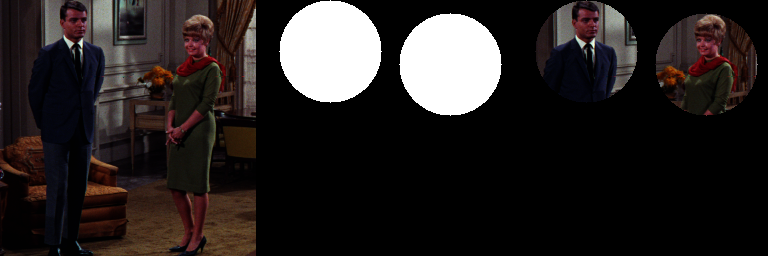

In [60]:
# 8.Membuat image masking

import cv2 as cv
import numpy as np
from google.colab.patches import cv2_imshow

img = cv.imread('/content/drive/MyDrive/PVCK/GAMBAR/couple.tiff')
h, w, c = img.shape

# Buat mask biner
mask = np.zeros((h, w), dtype=np.uint8)

cv.circle(mask, (int(w * 0.29), int(h * 0.20)), int(w * 0.20), 255, -1)

cv.circle(mask, (int(w * 0.76), int(h * 0.25)), int(w * 0.20), 255, -1)

# Lakukan masking menggunakan operator bitwise AND
masked_image = cv.bitwise_and(img, img, mask=mask)

# Konversi mask ke 3 channel untuk tampilan hconcat
mask_3ch = cv.cvtColor(mask, cv.COLOR_GRAY2BGR)

# Tampilkan Citra Asli, Mask, dan Hasil Masking
final_frame = cv.hconcat((img, mask_3ch, masked_image))
cv2_imshow(final_frame)

--- 1. NOT (Komplemen) ---


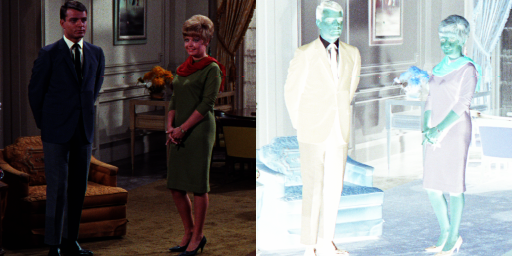

--- 2. OR (Atau) ---


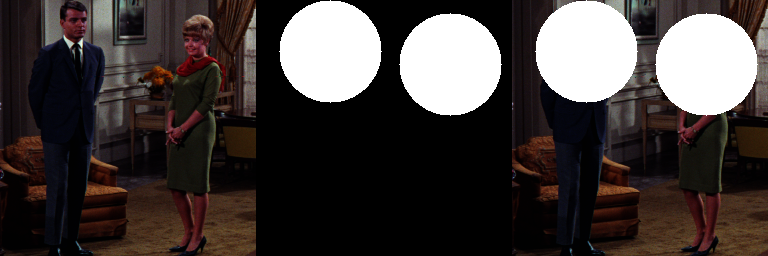

--- 3. AND (Dan) ---


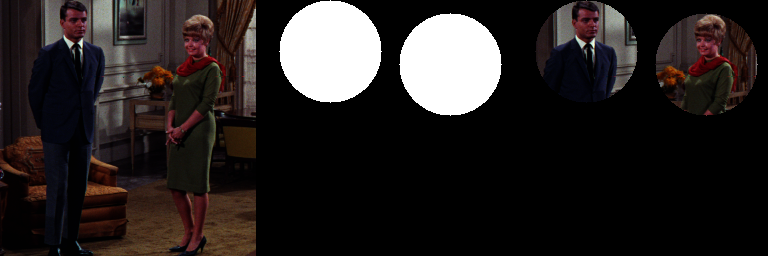

--- 4. NAND (Not AND) ---


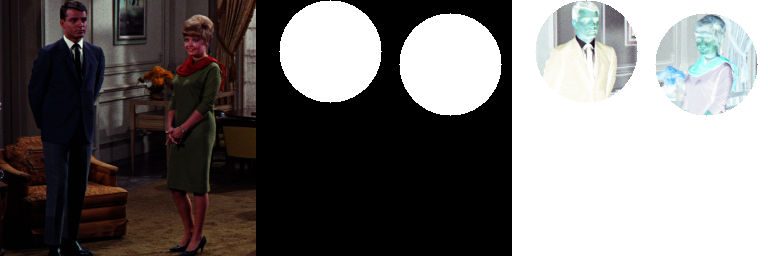

--- 5. XOR (Exclusive OR) ---


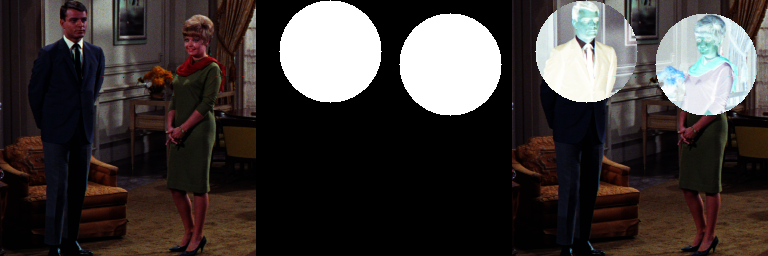

In [56]:
mask = np.zeros((h, w), dtype=np.uint8)
cv.circle(mask, (int(w * 0.29), int(h * 0.20)), int(w * 0.20), 255, -1)
cv.circle(mask, (int(w * 0.76), int(h * 0.25)), int(w * 0.20), 255, -1)
mask_3ch = cv.cvtColor(mask, cv.COLOR_GRAY2BGR)

# Input yang digunakan (Citra Asli + Mask)
image_input = cv.hconcat((img, mask_3ch))

# 2. Eksekusi 5 Operator Logika
out_not  = cv.bitwise_not(img)
out_or   = cv.bitwise_or(img, mask_3ch)
out_and  = cv.bitwise_and(img, mask_3ch)
out_nand = cv.bitwise_not(out_and)
out_xor  = cv.bitwise_xor(img, mask_3ch)

# 3. Tampilkan Hasil per Baris Tabel (Screenshot bagian ini untuk tabelmu)
print("--- 1. NOT (Komplemen) ---")
cv2_imshow(cv.hconcat((img, out_not)))

print("--- 2. OR (Atau) ---")
cv2_imshow(cv.hconcat((image_input, out_or)))

print("--- 3. AND (Dan) ---")
cv2_imshow(cv.hconcat((image_input, out_and)))

print("--- 4. NAND (Not AND) ---")
cv2_imshow(cv.hconcat((image_input, out_nand)))

print("--- 5. XOR (Exclusive OR) ---")
cv2_imshow(cv.hconcat((image_input, out_xor)))

Kiri: Asli | Tengah: Gamma Correction (0.5) | Kanan: Logarithmic Brightness


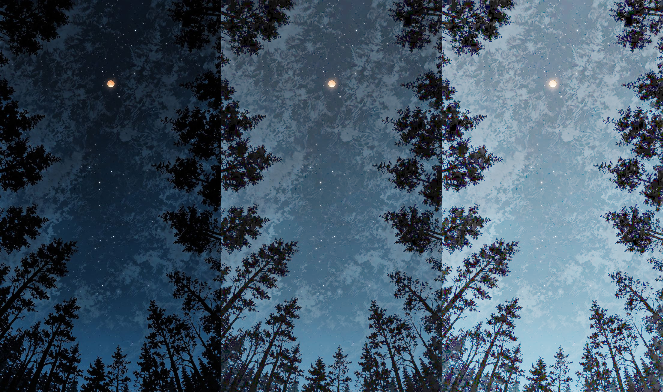

In [57]:
# 10.Foto Malam Hari

import cv2 as cv
import numpy as np
from google.colab.patches import cv2_imshow
from google.colab import drive

img = cv.imread('/content/drive/MyDrive/PVCK/GAMBAR/langit malam.jpg')

if img is None:
    print("Gambar tidak ditemukan. Pastikan path, nama file, dan kapitalisasi huruf sudah benar.")
else:
    # --- Gamma Correction (Metode Utama) ---
    img_normalized = img / 255.0
    gamma_value = 0.5
    gamma_corrected = np.power(img_normalized, gamma_value)
    gamma_corrected_uint8 = np.uint8(gamma_corrected * 255)

    # --- Logarithmic Brightness (Sebagai Perbandingan) ---
    img_float_log = img.astype(np.float32)
    r_max_log = np.max(img_float_log)
    c_log = 255 / np.log(1 + r_max_log)
    log_corrected = c_log * np.log(1 + img_float_log)
    log_corrected_uint8 = np.uint8(log_corrected)

    # --- Visualisasi Hasil ---
    # Memperkecil resolusi gambar sementara (skala 30%) agar ketiga gambar
    # muat dijejerkan dalam satu layar output Colab tanpa terpotong
    img_resized = cv.resize(img, (0, 0), fx=0.3, fy=0.3)
    gamma_resized = cv.resize(gamma_corrected_uint8, (0, 0), fx=0.3, fy=0.3)
    log_resized = cv.resize(log_corrected_uint8, (0, 0), fx=0.3, fy=0.3)

    # Menggabungkan gambar secara horizontal
    comparison_combined = cv.hconcat((img_resized, gamma_resized, log_resized))

    print("Kiri: Asli | Tengah: Gamma Correction (0.5) | Kanan: Logarithmic Brightness")
    cv2_imshow(comparison_combined)

Kiri: Citra Asli (Under-water Hazy) | Kanan: Hasil Perbaikan (CLAHE + Saturation)


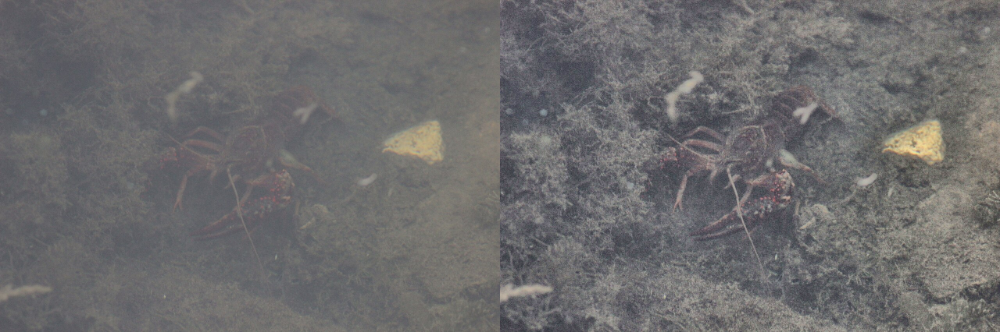

In [58]:
# 11. Memperbaiki kualitas pada gambar

import cv2 as cv
import numpy as np
from google.colab.patches import cv2_imshow

# Membaca citra asli
img = cv.imread('/content/drive/MyDrive/PVCK/GAMBAR/Crayfish.jpg')

if img is None:
    print("Gambar tidak ditemukan. Pastikan path file sudah benar.")
else:
    lab = cv.cvtColor(img, cv.COLOR_BGR2LAB)
    l_channel, a_channel, b_channel = cv.split(lab)

    clahe = cv.createCLAHE(clipLimit=3.0, tileGridSize=(8, 8))

    cl = clahe.apply(l_channel)

    merged_lab = cv.merge((cl, a_channel, b_channel))
    img_clahe = cv.cvtColor(merged_lab, cv.COLOR_LAB2BGR)

    hsv = cv.cvtColor(img_clahe, cv.COLOR_BGR2HSV)
    h, s, v = cv.split(hsv)

    s_float = s.astype(np.float32) * 1.4
    s_enhanced = np.clip(s_float, 0, 255).astype(np.uint8)

    enhanced_hsv = cv.merge((h, s_enhanced, v))
    final_img = cv.cvtColor(enhanced_hsv, cv.COLOR_HSV2BGR)

    img_resized = cv.resize(img, (0, 0), fx=0.5, fy=0.5)
    final_resized = cv.resize(final_img, (0, 0), fx=0.5, fy=0.5)

    perbandingan = cv.hconcat((img_resized, final_resized))

    print("Kiri: Citra Asli (Under-water Hazy) | Kanan: Hasil Perbaikan (CLAHE + Saturation)")
    cv2_imshow(perbandingan)